### Notebook for of identified fetal stem cells populations with LGR5+ stem cells from Haber, 2017 dataset

- **Developed by:** Anna Maguza
- **Place:** Wuerzburg Institute for System Immunology
- **Created date:** 19th August 2024
- **Last modified date:** 20th August 2024

#### Import required modules

In [1]:
import gdown
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import scarches as sca
import matplotlib.pyplot as plt

/home/amaguza/miniforge3/envs/expimap/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/amaguza/miniforge3/envs/expimap/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
 captum (see https://github.com/pytorch/captum).


In [2]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

#### Set up working environment

In [3]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
PIL                         10.2.0
absl                        NA
aiohttp                     3.9.3
aiosignal                   1.3.1
annotated_types             0.6.0
anyio                       NA
array_api_compat            1.4.1
arrow                       1.3.0
asttokens                   NA
async_timeout               4.0.3
attr                        23.2.0
attrs                       23.2.0
babel                       2.14.0
backoff                     2.2.1
bs4                         4.12.3
certifi                     2024.02.02
cffi                        1.16.0
charset_normalizer          3.3.2
chex                        0.1.7
click                       8.1.7
comm                        0.2.1
contextlib2                 NA
croniter                    NA
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.9.0
debugpy                     1.8.1
decorator                   5.1.1

In [4]:
warnings.simplefilter(action = 'ignore')
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

In [5]:
torch.cuda.is_available()

True

#### Read data

In [6]:
adata = sc.read_h5ad('/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Haber_2017_Smartseq/Haber_2017_Smartseq_stem_cells_remapped_human_orthologues_genes.h5ad')
X_is_raw(adata)

True

In [7]:
adata_query = sc.read_h5ad('FetalSC_data/Fetal_cells_scvi.h5ad')
adata_query = adata_query.raw.to_adata()

In [8]:
gene_ids_adata = adata.var['Human gene stable ID']
gene_ids_query = adata_query.var['gene_id-0-0']
common_genes = gene_ids_adata[gene_ids_adata.isin(gene_ids_query)].values
adata = adata[:, adata.var['Human gene stable ID'].isin(common_genes)].copy()
adata_query = adata_query[:, adata_query.var['gene_id-0-0'].isin(common_genes)].copy()

In [9]:
adata = adata[:, ~adata.var_names.isin(['DIABLO', 'IGF2'])].copy()

In [10]:
adata = adata[:, ~adata.var_names.duplicated()].copy()
adata_query = adata_query[:, ~adata_query.var_names.duplicated()].copy()

In [11]:
adata.obs['Cell States'] = adata.obs['Cell_Type'].astype(str) + '_' + adata.obs['GFP_intensity'].astype(str)

In [12]:
adata_query

AnnData object with n_obs × n_vars = 231646 × 16043
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

In [13]:
adata.obs['Library_Preparation_Protocol'] = 'Smartseq2'
adata.obs['Study_name'] = 'Haber, 2017'
adata.obs['Organism'] = 'Mus Musculus'
adata_query.obs['Organism'] = 'Homo sapiens'

In [14]:
adata = adata[adata.obs['Cell States']=='Stem_GFPHigh']

### Read the Reactome annotations

In [15]:
reactome_link = '/mnt/LaCIE/annaM/reactome/reactome.gmt'

### Prepare reference data with ReactomeDB pathways

In [16]:
sca.utils.add_annotations(adata, reactome_link, min_genes = 12, clean = True)

- Remove all genes that are present in the data but absent in ReactomeDB

In [17]:
adata._inplace_subset_var(adata.varm['I'].sum(1)>0)

### Calculate HVGs

In [18]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "Donor_ID",
    subset = True,
    span = 1
)
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 367 × 4673
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'Cell_Type', 'full_cell_description', 'Sample', 'Cell States', 'Library_Preparation_Protocol', 'Study_name', 'Organism'
    var: 'original_mouse_gene_id', 'Gene stable ID version', 'Transcript stable ID', 'Transcript stable ID version', 'Human gene stable ID', 'Human homology type', '%id. target Human gene identical to query gene', '%id. query gene identical to target Human gene', 'Human Gene-order conservation score', 'Human orthology confidence [0 low, 1 high]', 'Human protein or transcript stable ID', 'Query protein or transcript ID', 'Protein stable ID', 'Protein stable ID version', 'Gene name', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'terms', 'hvg'
    varm: 'I'
    layers: 'counts'

- Filter out all annotations (terms) with less than 12 genes.

In [19]:
select_terms = adata.varm['I'].sum(0)>12
adata.uns['terms'] = np.array(adata.uns['terms'])[select_terms].tolist()
adata.varm['I'] = adata.varm['I'][:, select_terms]

- Filter out genes not present in any of the terms after selection of HVGs.

In [20]:
adata._inplace_subset_var(adata.varm['I'].sum(1)>0)

### Create expiMap model and train it on reference dataset

In [21]:
adata.X = adata.X.astype(np.float32)

In [22]:
intr_cvae = sca.models.EXPIMAP(
    adata = adata,
    condition_key = 'Cell States',
    hidden_layer_sizes = [256, 256, 256],
    recon_loss = 'nb'
)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 4673 256 1
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 534
Decoder Architecture:
	Masked linear layer in, ext_m, ext, cond, out:  534 0 0 1 4673
	with hard mask.
Last Decoder layer: softmax


In [23]:
ALPHA = 0.7

In [24]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_unweighted_loss", # val_unweighted_loss
    "threshold": 0,
    "patience": 50,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}
intr_cvae.train(
    n_epochs = 400,
    alpha_epoch_anneal = 100,
    alpha = ALPHA,
    alpha_kl = 0.5,
    weight_decay = 0.,
    early_stopping_kwargs = early_stopping_kwargs,
    use_early_stopping = True,
    monitor_only_val = False,
    seed = 1712,
    accelerator = "gpu",
    devices = [0]
)

Preparing (367, 4673)
Instantiating dataset
Init the group lasso proximal operator for the main terms.
 |████████████████████| 100.0%  - epoch_loss: 15155.0458984375 - epoch_recon_loss: 14695.9583333333 - epoch_kl_loss: 918.1752319336 - val_loss: 16317.8935546875 - val_recon_loss: 15828.0517578125 - val_kl_loss: 979.68438720701
Saving best state of network...
Best State was in Epoch 398


In [25]:
MEAN = False

In [26]:
adata.obsm['X_cvae'] = intr_cvae.get_latent(mean = MEAN, only_active = True)

+ Extract meaningful latent directions

In [27]:
intr_cvae.latent_directions(adata=adata)

### Initlizling the model for query training

### MTRNR2L12+ASS1+_SC

+ Prepare query dataset

In [28]:
adata_query_full = adata_query.copy()

In [29]:
adata_query = adata_query[adata_query.obs['Cell States']=='MTRNR2L12+ASS1+_SC'].copy()

In [30]:
adata_query = adata_query[:, adata.var_names]

+ Add terms to query dataset

In [31]:
adata_query.uns['terms'] = adata.uns['terms']

+ Train the model

In [32]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(adata_query, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 3979 × 4673
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'Organism'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 4673 256 2
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 534
Decod

In [33]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (3979, 4673)
Instantiating dataset
 |███-----------------| 19.2%  - val_loss: 2368.1388549805 - val_recon_loss: 2328.3544311523 - val_kl_loss: 523.4792022705
ADJUSTED LR
 |█████---------------| 26.8%  - val_loss: 2432.8322143555 - val_recon_loss: 2381.0139160156 - val_kl_loss: 518.1831054688
ADJUSTED LR
 |██████--------------| 32.8%  - val_loss: 2411.1149291992 - val_recon_loss: 2359.2037353516 - val_kl_loss: 519.1114654541
ADJUSTED LR
 |██████--------------| 34.5%  - val_loss: 2423.6613159180 - val_recon_loss: 2371.7752685547 - val_kl_loss: 518.8607254028
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 116


In [34]:
q_intr_cvae.save('/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Fetal_stem_cells/FetalSC_vs_LGR5+_Haber_2017/expimap_model_MTRNR2L12+ASS1+_SC', overwrite=True)

### Get latent representation of reference + query dataset

In [35]:
adata_joined = sc.AnnData.concatenate(adata, adata_query, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 4346 × 4673
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'Cell_Type', 'full_cell_description', 'Sample', 'Cell States', 'Library_Preparation_Protocol', 'Study_name', 'Organism', 'Sample_ID', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'batch_join'
    var: 'original_mouse_gene_id-0', 'Gene stable ID version-0', 'Transcript stable ID-0', 'Transcript stable ID version-0', 'Human gene stable ID-0', 'Human homology type-0', '%id. target Human gene identical to query gene-0', '%id. query gene identical to target Human gene-0', 'Human Gene-order conservation score-0', 'Human orthology confidence [0 low, 1 high]-0', 'Human protein or tra

+ Get latent representation for the concatenated dataset

In [36]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['Cell States'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [37]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


+ Extract meaningful latent directions

In [38]:
q_intr_cvae.latent_directions(adata=adata_joined)

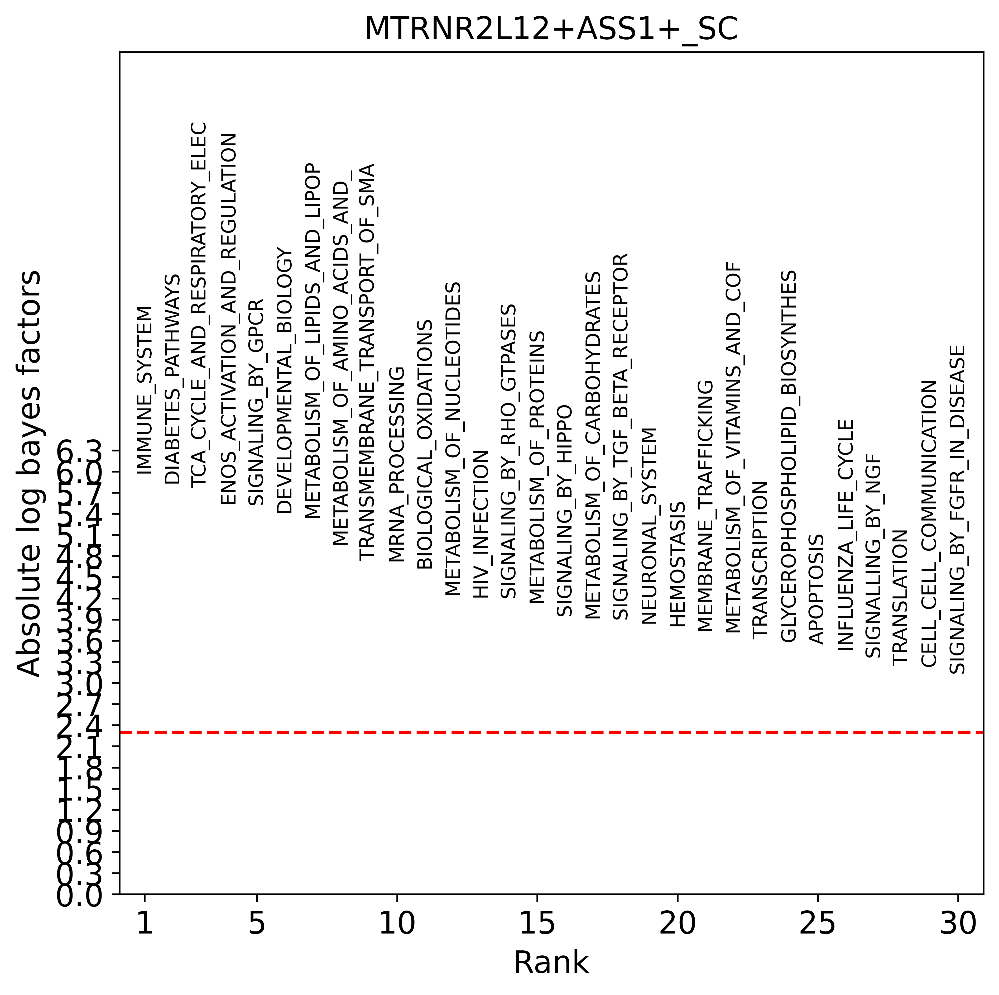

In [39]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'Cell States', comparison = 'Stem_GFPHigh', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

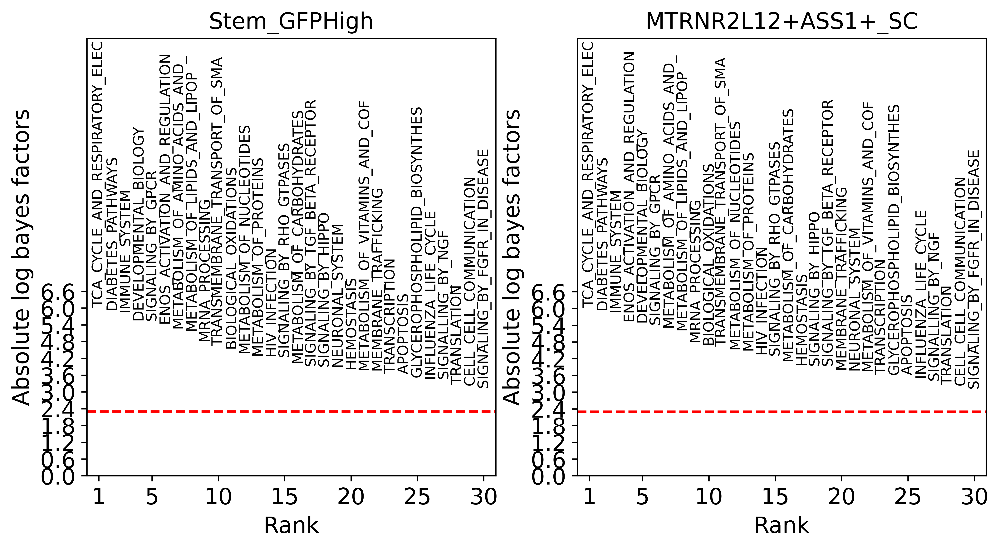

In [40]:
q_intr_cvae.latent_enrich(groups='Cell States', adata=adata_joined, n_sample=10000, use_directions=True)
fig = sca.plotting.plot_abs_bfs(adata_joined, n_cols=3, scale_y=2.6, yt_step=0.6, fontsize = 9)
fig.set_size_inches(10, 5)

### Visualize gene programs of interest

In [42]:
terms = adata_joined.uns['terms']
select_terms = ['TCA_CYCLE_AND_RESPIRATORY_ELEC', 'DIABETES_PATHWAYS', 'IMMUNE_SYSTEM', 
                'DEVELOPMENTAL_BIOLOGY', 'SIGNALING_BY_GPCR', 'ENOS_ACTIVATION_AND_REGULATION']
idx = [terms.index(term) for term in select_terms]

In [ ]:
terms = adata_joined.uns['terms']
select_terms = ['METABOLISM_OF_LIPIDS_AND_LIPOP', 'METABOLISM_OF_PROTEINS', 'IMMUNE_SYSTEM', 'METABOLISM_OF_MRNA', 'TRANSMEMBRANE_TRANSPORT_OF_SMA',
                'METABOLISM_OF_AMINO_ACIDS_AND_', 'CELL_CYCLE', 'CELLULAR_RESPONSE_TO_STRESS', 'CELL_CELL_COMMUNICATION', 'METABOLISM_OF_PROTEINS']
'DNA_REPAIR', 'METABOLISM_OF_AMINO_ACIDS_AND_', 'METABOLISM_OF_LIPIDS_AND_LIPOP', 'IMMUNE_SYSTEM',
                'GENERIC_TRANSCRIPTION_PATHWAY', 'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'DIABETES_PATHWAYS', 'REGULATION_OF_HYPOXIA_INDUCIBL', 'SIGNALING_BY_HIPPO', 'METABOLISM_OF_LIPIDS_AND_LIPOP', 'PHOSPHOLIPID_METABOLISM', 'SIGNALING_BY_RHO_GTPASES'
idx = [terms.index(term) for term in select_terms]

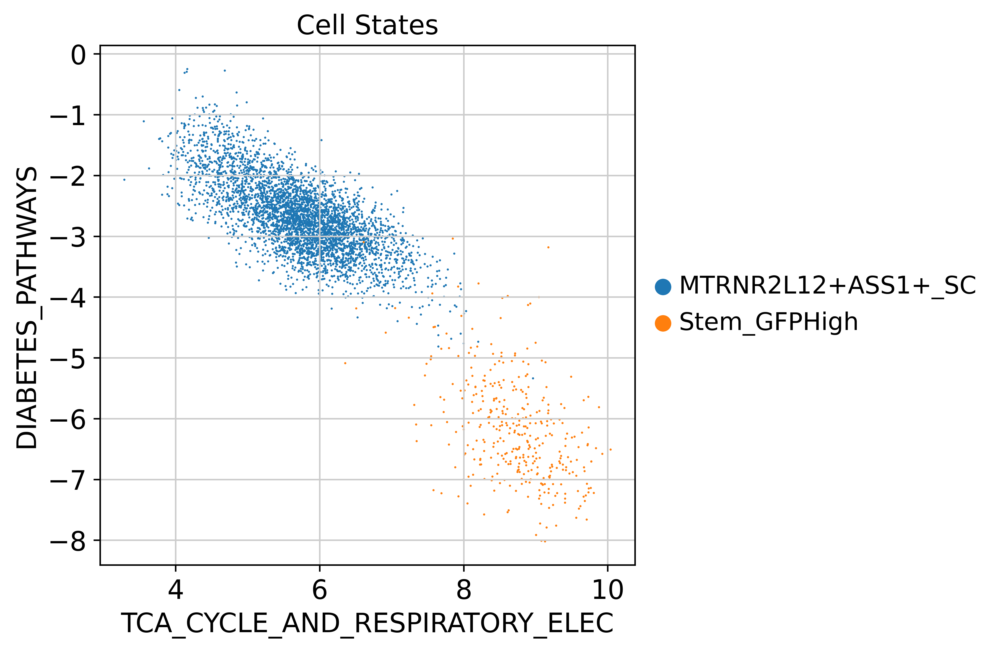

In [43]:
latents = (q_intr_cvae.get_latent(adata_joined.X, adata_joined.obs['Cell States'], mean=MEAN) * adata_joined.uns['directions'])[:, idx]
adata_joined.obs['TCA_CYCLE_AND_RESPIRATORY_ELEC'] = latents[:, 0]
adata_joined.obs['DIABETES_PATHWAYS'] = latents[:, 1]
sc.set_figure_params(dpi=300, figsize=(5, 5))
sc.pl.scatter(adata_joined, x='TCA_CYCLE_AND_RESPIRATORY_ELEC', y='DIABETES_PATHWAYS', color='Cell States', size=5)

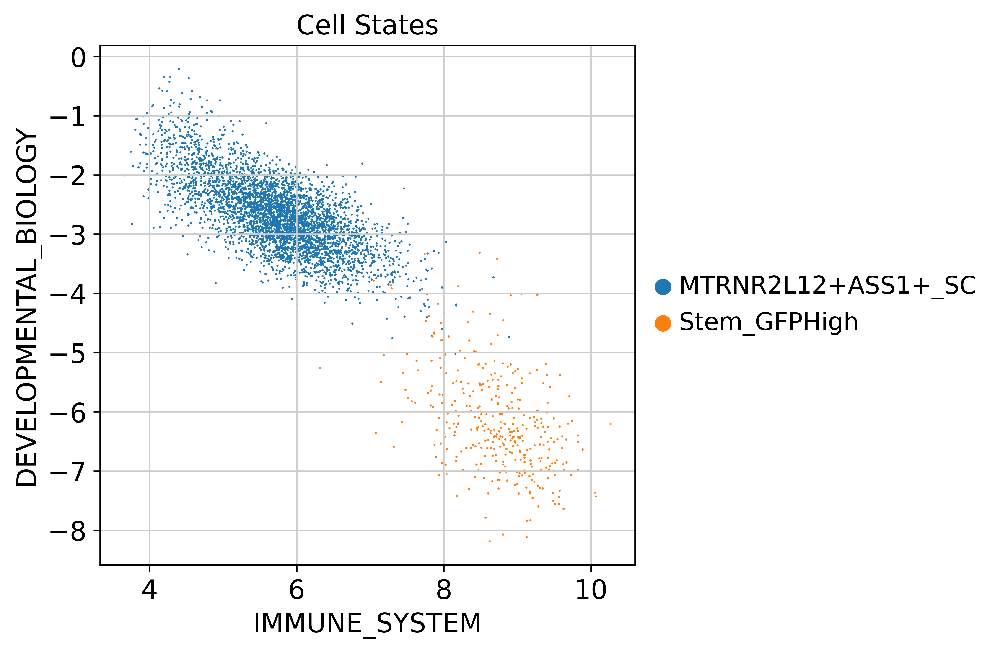

In [44]:
latents = (q_intr_cvae.get_latent(adata_joined.X, adata_joined.obs['Cell States'], mean=MEAN) * adata_joined.uns['directions'])[:, idx]
adata_joined.obs['IMMUNE_SYSTEM'] = latents[:, 0]
adata_joined.obs['DEVELOPMENTAL_BIOLOGY'] = latents[:, 1]
sc.set_figure_params(dpi=300, figsize=(5, 5))
sc.pl.scatter(adata_joined, x='IMMUNE_SYSTEM', y='DEVELOPMENTAL_BIOLOGY', color='Cell States', size=5)

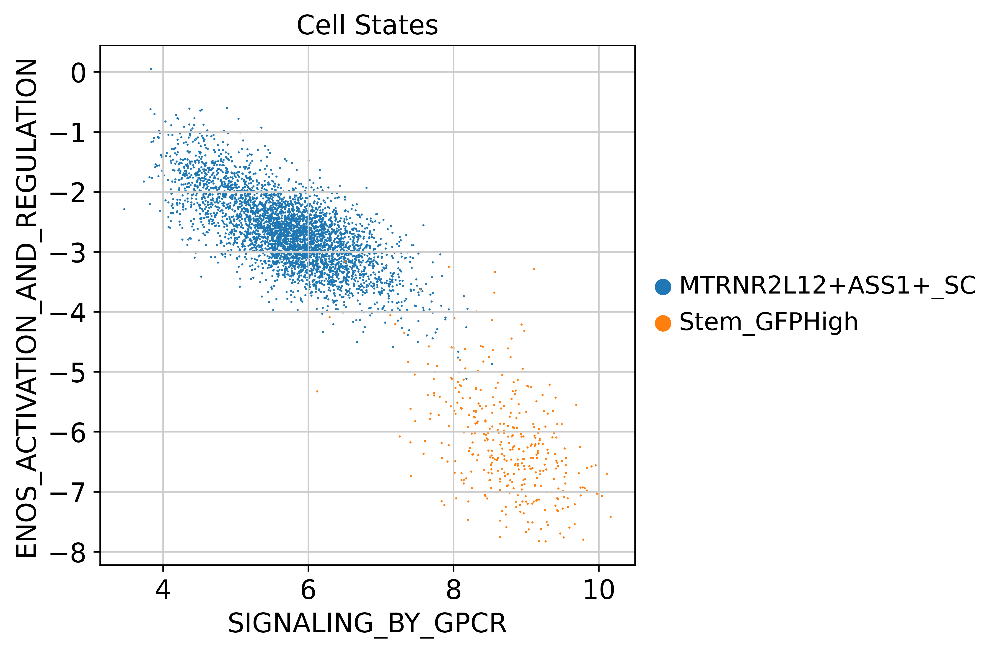

In [45]:
latents = (q_intr_cvae.get_latent(adata_joined.X, adata_joined.obs['Cell States'], mean=MEAN) * adata_joined.uns['directions'])[:, idx]
adata_joined.obs['SIGNALING_BY_GPCR'] = latents[:, 0]
adata_joined.obs['ENOS_ACTIVATION_AND_REGULATION'] = latents[:, 1]
sc.set_figure_params(dpi=300, figsize=(5, 5))
sc.pl.scatter(adata_joined, x='SIGNALING_BY_GPCR', y='ENOS_ACTIVATION_AND_REGULATION', color='Cell States', size=5)

#### RPS10+_RPS17+_SC

In [46]:
adata_query = adata_query_full.copy()

In [47]:
adata_query = adata_query[adata_query.obs['Cell States']=='RPS10+_RPS17+_SC'].copy()

In [48]:
adata_query = adata_query[:, adata.var_names]

+ Add terms to query dataset

In [49]:
adata_query.uns['terms'] = adata.uns['terms']

+ Train the model

In [50]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(adata_query, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 3544 × 4673
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'Organism'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 4673 256 2
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 534
Decod

In [51]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (3544, 4673)
Instantiating dataset
 |███████████---------| 57.2%  - val_loss: 2433.8998209635 - val_recon_loss: 2395.0667317708 - val_kl_loss: 388.3302612305
ADJUSTED LR
 |████████████--------| 61.8%  - val_loss: 2440.8571777344 - val_recon_loss: 2402.0448404948 - val_kl_loss: 388.1227722168
ADJUSTED LR
 |██████████████------| 70.2%  - val_loss: 2439.5367024740 - val_recon_loss: 2400.7530924479 - val_kl_loss: 387.8354390462
ADJUSTED LR
 |██████████████------| 72.0%  - val_loss: 2436.7860514323 - val_recon_loss: 2398.0014648438 - val_kl_loss: 387.8450622559
Stopping early: no improvement of more than 0 nats in 20 epochs
If the early stopping criterion is too strong, please instantiate it with different parameters in the train method.
Saving best state of network...
Best State was in Epoch 266


In [52]:
q_intr_cvae.save('/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Fetal_stem_cells/FetalSC_vs_LGR5+_Haber_2017/expimap_model_Rpso', overwrite=True)

### Get latent representation of reference + query dataset

In [53]:
adata_joined = sc.AnnData.concatenate(adata, adata_query, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 3911 × 4673
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'Cell_Type', 'full_cell_description', 'Sample', 'Cell States', 'Library_Preparation_Protocol', 'Study_name', 'Organism', 'Sample_ID', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'batch_join'
    var: 'original_mouse_gene_id-0', 'Gene stable ID version-0', 'Transcript stable ID-0', 'Transcript stable ID version-0', 'Human gene stable ID-0', 'Human homology type-0', '%id. target Human gene identical to query gene-0', '%id. query gene identical to target Human gene-0', 'Human Gene-order conservation score-0', 'Human orthology confidence [0 low, 1 high]-0', 'Human protein or tra

+ Get latent representation for the concatenated dataset

In [54]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['Cell States'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [55]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


+ Extract meaningful latent directions

In [56]:
q_intr_cvae.latent_directions(adata=adata_joined)

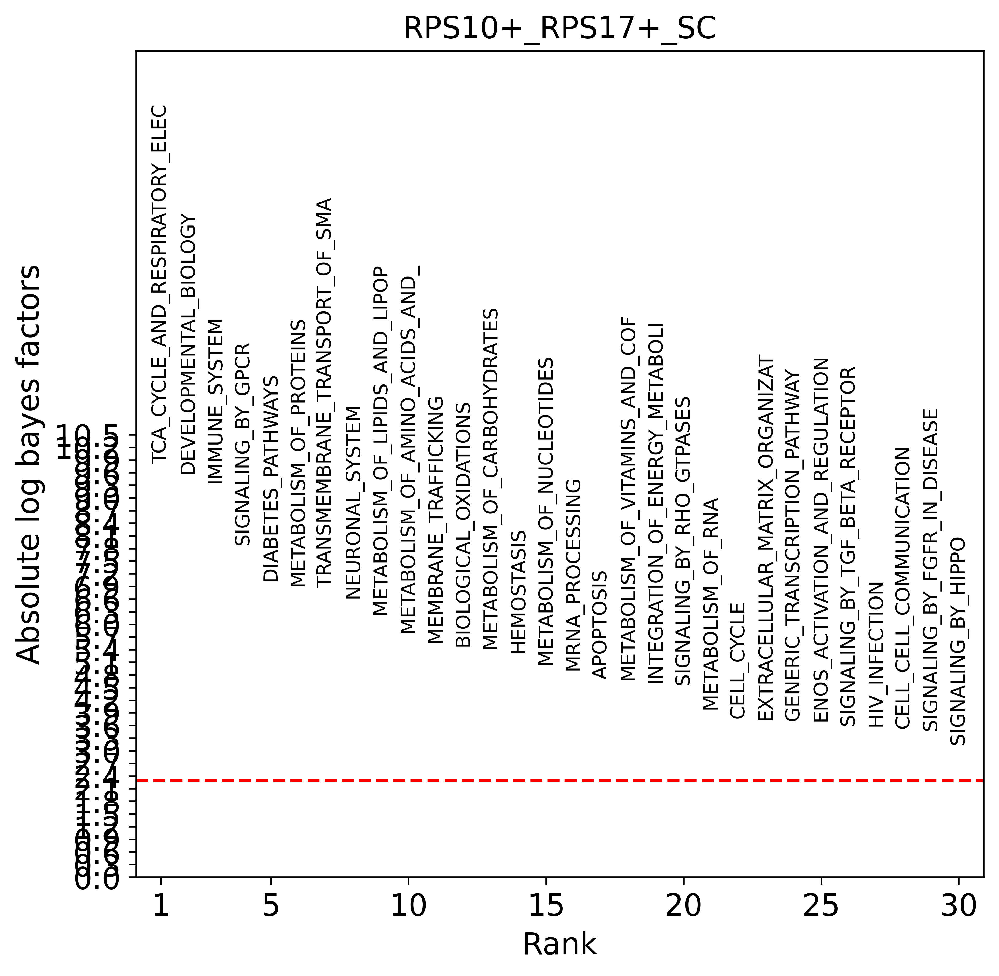

In [57]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'Cell States', comparison = 'Stem_GFPHigh', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

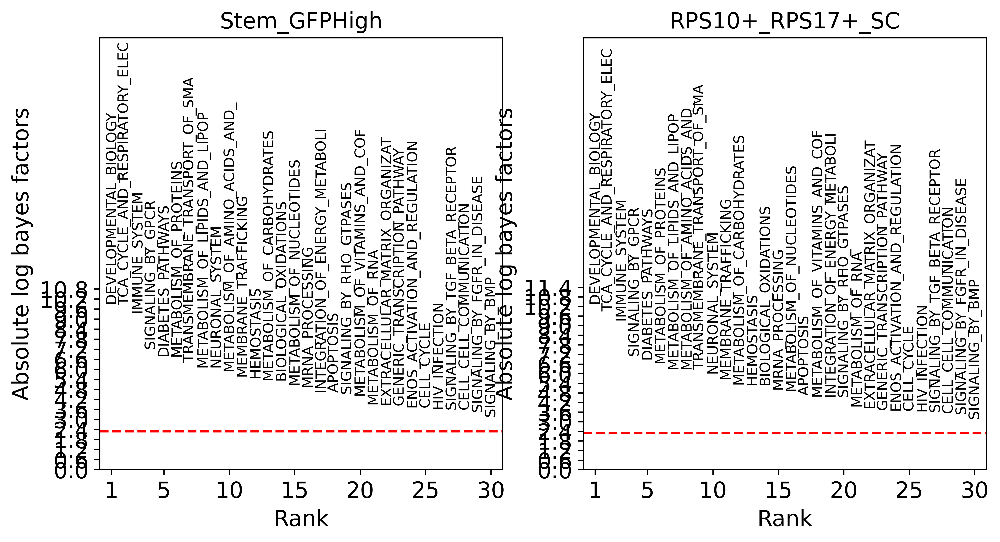

In [58]:
q_intr_cvae.latent_enrich(groups='Cell States', adata=adata_joined, n_sample=10000, use_directions=True)
fig = sca.plotting.plot_abs_bfs(adata_joined, n_cols=3, scale_y=2.6, yt_step=0.6, fontsize = 9)
fig.set_size_inches(10, 5)

### Visualize gene programs of interest

In [59]:
terms = adata_joined.uns['terms']
select_terms = ['TCA_CYCLE_AND_RESPIRATORY_ELEC', 'DIABETES_PATHWAYS', 'IMMUNE_SYSTEM', 
                'DEVELOPMENTAL_BIOLOGY', 'SIGNALING_BY_GPCR', 'METABOLISM_OF_PROTEINS']
idx = [terms.index(term) for term in select_terms]

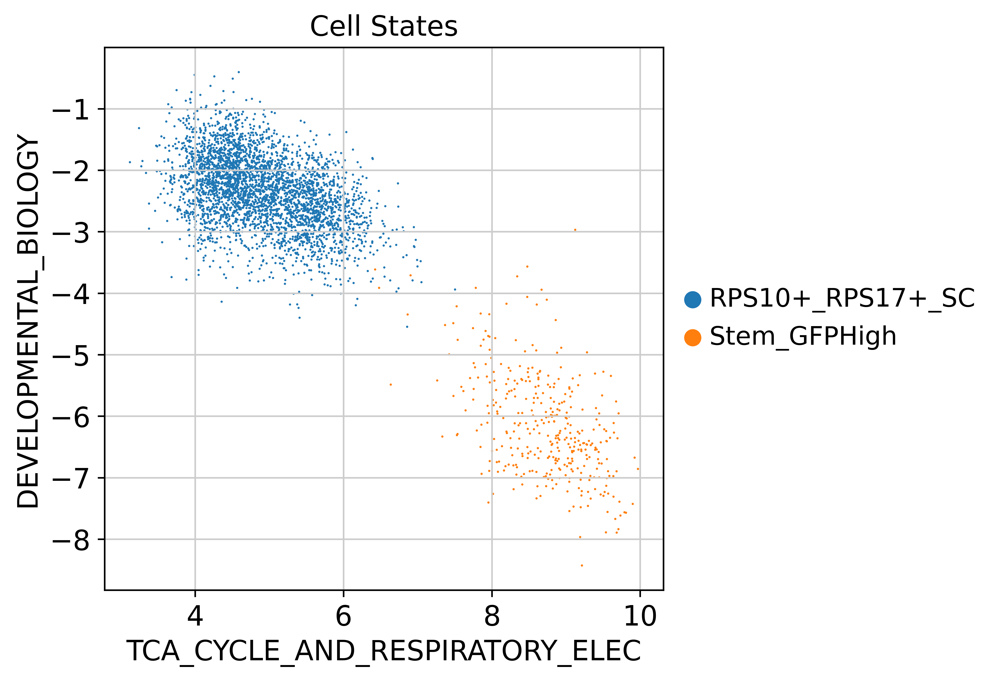

In [60]:
latents = (q_intr_cvae.get_latent(adata_joined.X, adata_joined.obs['Cell States'], mean=MEAN) * adata_joined.uns['directions'])[:, idx]
adata_joined.obs['TCA_CYCLE_AND_RESPIRATORY_ELEC'] = latents[:, 0]
adata_joined.obs['DEVELOPMENTAL_BIOLOGY'] = latents[:, 1]
sc.set_figure_params(dpi=300, figsize=(5, 5))
sc.pl.scatter(adata_joined, x='TCA_CYCLE_AND_RESPIRATORY_ELEC', y='DEVELOPMENTAL_BIOLOGY', color='Cell States', size=5)

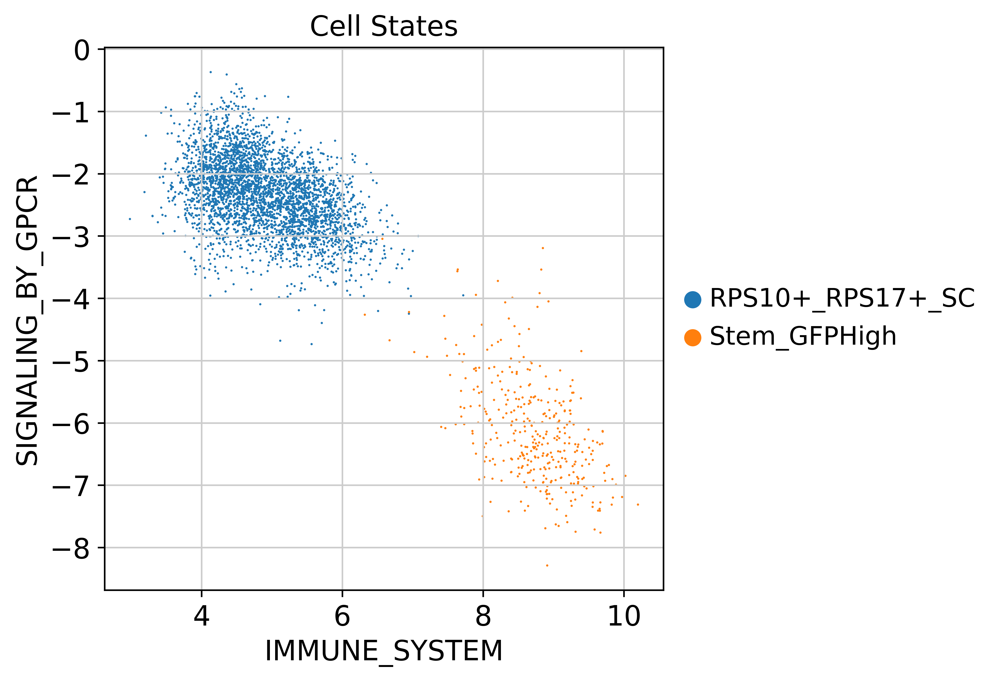

In [61]:
latents = (q_intr_cvae.get_latent(adata_joined.X, adata_joined.obs['Cell States'], mean=MEAN) * adata_joined.uns['directions'])[:, idx]
adata_joined.obs['IMMUNE_SYSTEM'] = latents[:, 0]
adata_joined.obs['SIGNALING_BY_GPCR'] = latents[:, 1]
sc.set_figure_params(dpi=300, figsize=(5, 5))
sc.pl.scatter(adata_joined, x='IMMUNE_SYSTEM', y='SIGNALING_BY_GPCR', color='Cell States', size=5)

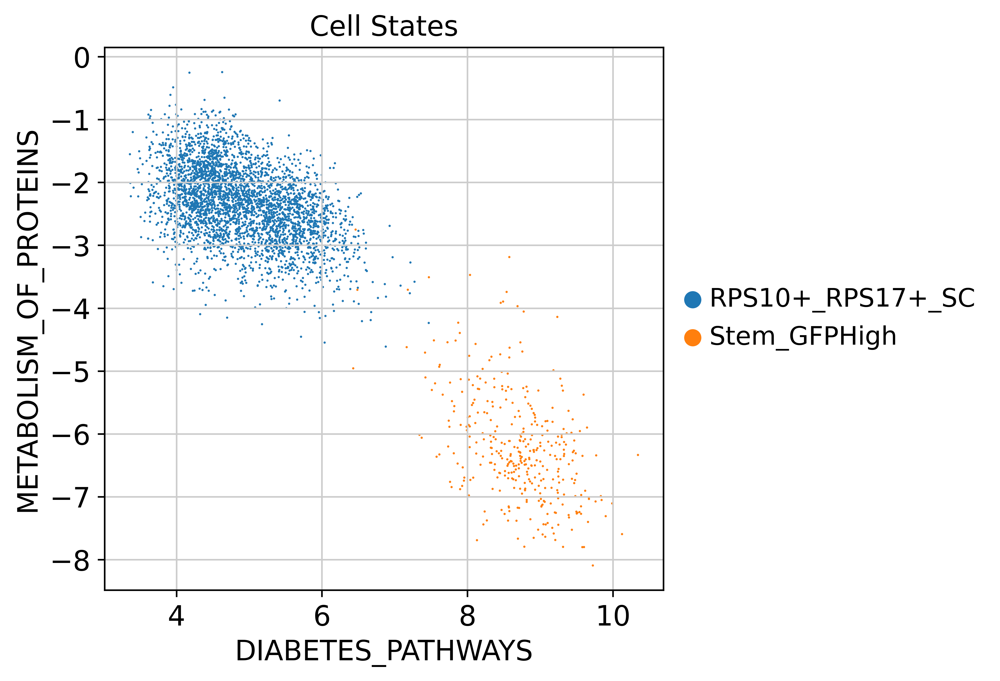

In [62]:
latents = (q_intr_cvae.get_latent(adata_joined.X, adata_joined.obs['Cell States'], mean=MEAN) * adata_joined.uns['directions'])[:, idx]
adata_joined.obs['DIABETES_PATHWAYS'] = latents[:, 0]
adata_joined.obs['METABOLISM_OF_PROTEINS'] = latents[:, 1]
sc.set_figure_params(dpi=300, figsize=(5, 5))
sc.pl.scatter(adata_joined, x='DIABETES_PATHWAYS', y='METABOLISM_OF_PROTEINS', color='Cell States', size=5)

#### FXYD3+_CKB+_SC

In [63]:
adata_query = adata_query_full.copy()

In [64]:
adata_query = adata_query[adata_query.obs['Cell States']=='FXYD3+_CKB+_SC'].copy()

In [65]:
adata_query = adata_query[:, adata.var_names]

+ Add terms to query dataset

In [66]:
adata_query.uns['terms'] = adata.uns['terms']

+ Train the model

In [67]:
q_intr_cvae = sca.models.EXPIMAP.load_query_data(adata_query, intr_cvae,
                                                 unfreeze_ext=True,
                                                 use_hsic=True,
                                                 hsic_one_vs_all=True
                                                )

AnnData object with n_obs × n_vars = 294 × 4673
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'Organism'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors', 'umap', 'terms'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    obsp: 'connectivities', 'distances'

INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 4673 256 2
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 534
Decode

In [68]:
q_intr_cvae.train(n_epochs = 400, 
                  alpha_epoch_anneal = 100, 
                  weight_decay = 0.,
                  alpha_kl = 0.1, 
                  seed = 1712, 
                  alpha_l1=0.96,
                  gamma_ext=0.7,
                  gamma_epoch_anneal=50, 
                  beta=3.,
                  use_early_stopping = True,
                  accelerator = "gpu",
                  devices = [0])

Preparing (294, 4673)
Instantiating dataset
 |████████████████████| 100.0%  - val_loss: 3020.2934570312 - val_recon_loss: 2955.7062988281 - val_kl_loss: 645.8712768555
Saving best state of network...
Best State was in Epoch 399


In [69]:
q_intr_cvae.save('/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Fetal_stem_cells/FetalSC_vs_LGR5+_Haber_2017/expimap_model_FXYD3+_CKB+_SC', overwrite=True)

### Get latent representation of reference + query dataset

In [70]:
adata_joined = sc.AnnData.concatenate(adata, adata_query, batch_key = 'batch_join', uns_merge = 'same', index_unique = None)
adata_joined

AnnData object with n_obs × n_vars = 661 × 4673
    obs: 'barcode', 'Gene_marker', 'Donor_ID', 'GFP_intensity', 'Cell_Type', 'full_cell_description', 'Sample', 'Cell States', 'Library_Preparation_Protocol', 'Study_name', 'Organism', 'Sample_ID', 'Cell Type', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'batch', 'Age_group', 'Location', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts', 'batch_join'
    var: 'original_mouse_gene_id-0', 'Gene stable ID version-0', 'Transcript stable ID-0', 'Transcript stable ID version-0', 'Human gene stable ID-0', 'Human homology type-0', '%id. target Human gene identical to query gene-0', '%id. query gene identical to target Human gene-0', 'Human Gene-order conservation score-0', 'Human orthology confidence [0 low, 1 high]-0', 'Human protein or tran

+ Get latent representation for the concatenated dataset

In [71]:
adata_joined.obsm['X_cvae'] = q_intr_cvae.get_latent(adata_joined.X, 
                                                adata_joined.obs['Cell States'], 
                                                mean = MEAN, 
                                                only_active = True)

+ Visualize latent representation on the UMAP

In [72]:
if 'neighbors' in adata_joined.uns:
    del adata_joined.uns['neighbors']
sc.pp.neighbors(adata_joined, n_neighbors=20, metric='minkowski', use_rep='X_cvae')
sc.tl.umap(adata_joined, min_dist = 0.5, spread = 6, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


+ Extract meaningful latent directions

In [73]:
q_intr_cvae.latent_directions(adata=adata_joined)

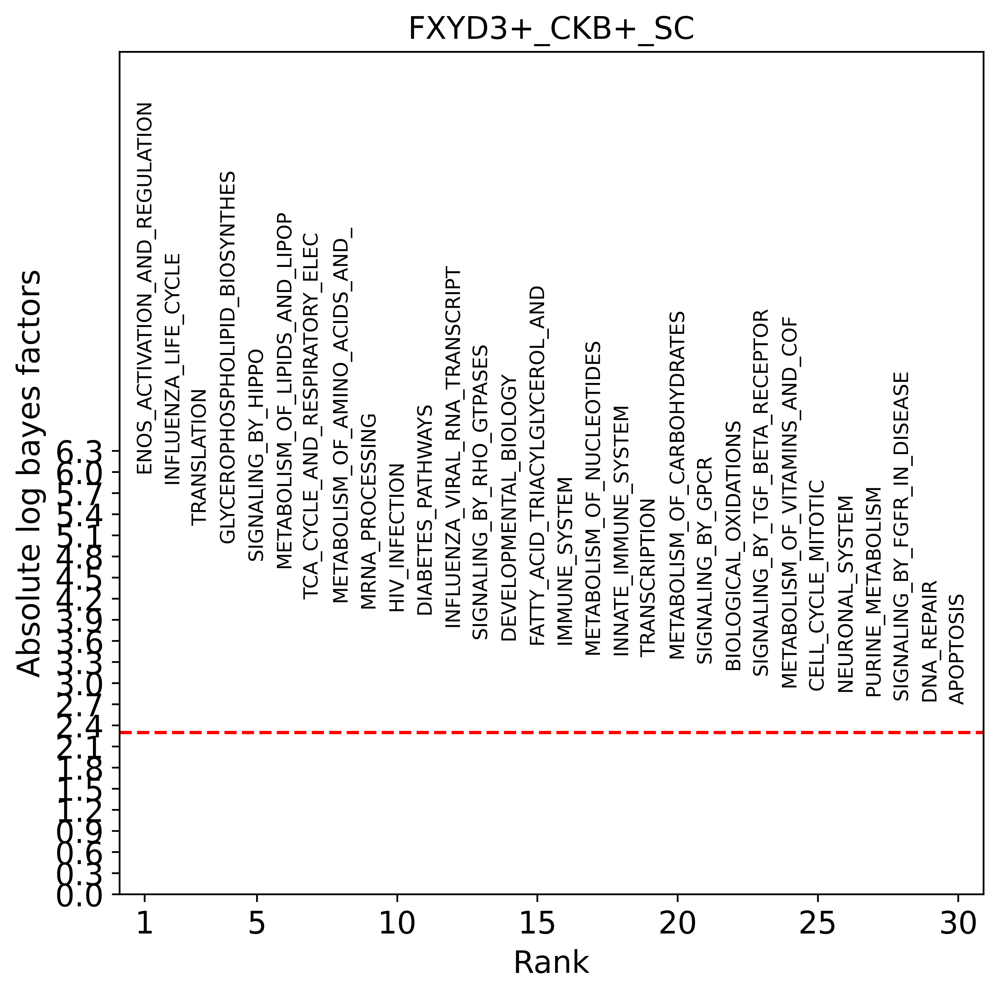

In [74]:
sc.set_figure_params(dpi=300, figsize=(7, 7))
q_intr_cvae.latent_enrich(groups = 'Cell States', comparison = 'Stem_GFPHigh', adata = adata_joined, use_directions = True)
fig = sca.plotting.plot_abs_bfs(adata_joined, yt_step = 0.3, scale_y = 2, fontsize = 9)

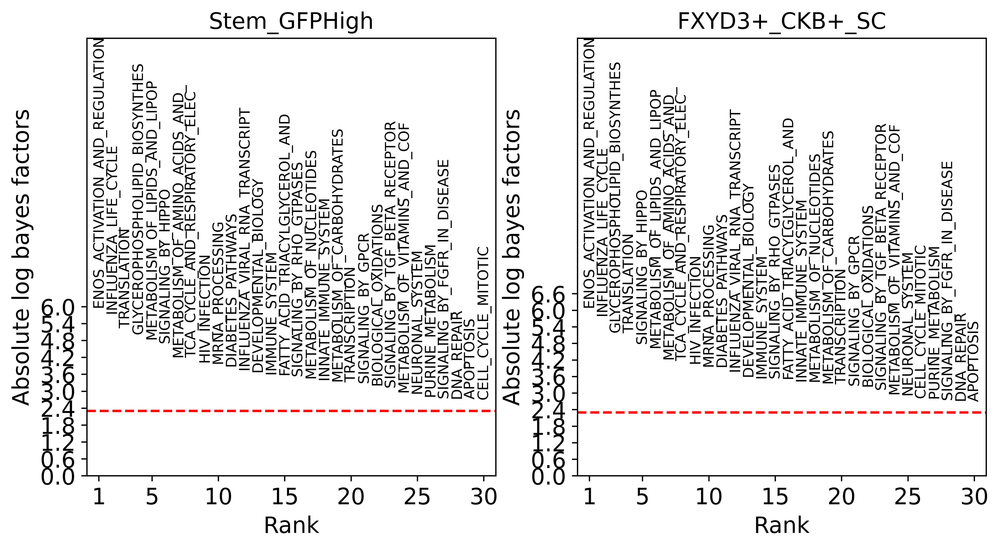

In [75]:
q_intr_cvae.latent_enrich(groups='Cell States', adata=adata_joined, n_sample=10000, use_directions=True)
fig = sca.plotting.plot_abs_bfs(adata_joined, n_cols=3, scale_y=2.6, yt_step=0.6, fontsize = 9)
fig.set_size_inches(10, 5)

### Visualize gene programs of interest

In [79]:
terms = adata_joined.uns['terms']
select_terms = ['ENOS_ACTIVATION_AND_REGULATION', 'INFLUENZA_LIFE_CYCLE', 'TRANSLATION', 
                'GLYCEROPHOSPHOLIPID_BIOSYNTHES', 'METABOLISM_OF_LIPIDS_AND_LIPOP', 'SIGNALING_BY_HIPPO']
idx = [terms.index(term) for term in select_terms]

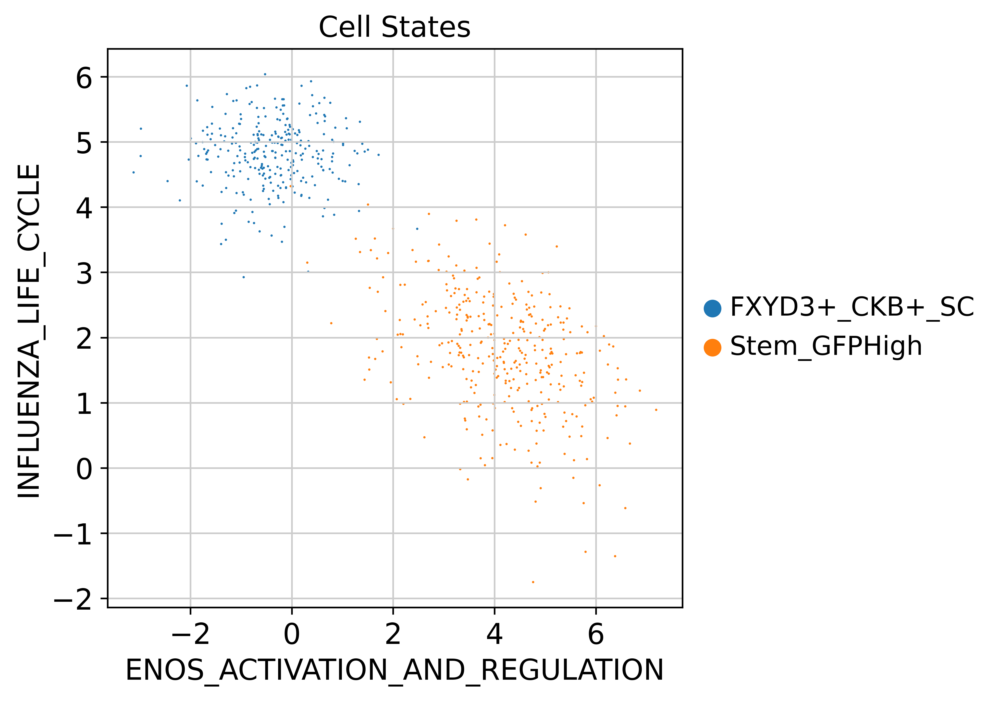

In [80]:
latents = (q_intr_cvae.get_latent(adata_joined.X, adata_joined.obs['Cell States'], mean=MEAN) * adata_joined.uns['directions'])[:, idx]
adata_joined.obs['ENOS_ACTIVATION_AND_REGULATION'] = latents[:, 0]
adata_joined.obs['INFLUENZA_LIFE_CYCLE'] = latents[:, 1]
sc.set_figure_params(dpi=300, figsize=(5, 5))
sc.pl.scatter(adata_joined, x='ENOS_ACTIVATION_AND_REGULATION', y='INFLUENZA_LIFE_CYCLE', color='Cell States', size=5)

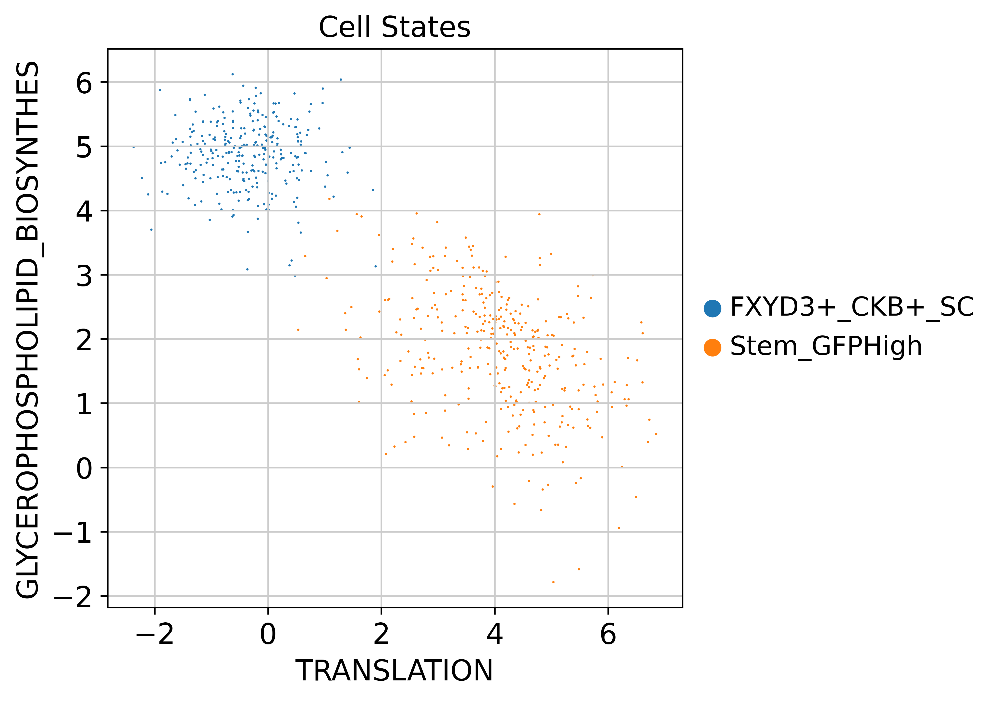

In [81]:
latents = (q_intr_cvae.get_latent(adata_joined.X, adata_joined.obs['Cell States'], mean=MEAN) * adata_joined.uns['directions'])[:, idx]
adata_joined.obs['TRANSLATION'] = latents[:, 0]
adata_joined.obs['GLYCEROPHOSPHOLIPID_BIOSYNTHES'] = latents[:, 1]
sc.set_figure_params(dpi=300, figsize=(5, 5))
sc.pl.scatter(adata_joined, x='TRANSLATION', y='GLYCEROPHOSPHOLIPID_BIOSYNTHES', color='Cell States', size=5)

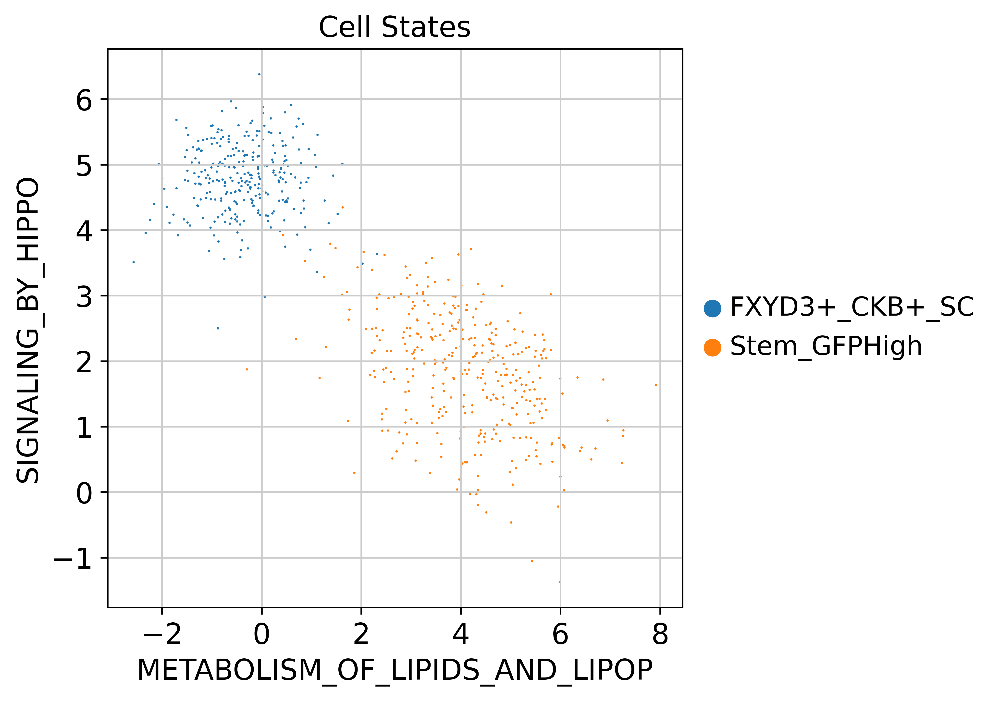

In [82]:
latents = (q_intr_cvae.get_latent(adata_joined.X, adata_joined.obs['Cell States'], mean=MEAN) * adata_joined.uns['directions'])[:, idx]
adata_joined.obs['METABOLISM_OF_LIPIDS_AND_LIPOP'] = latents[:, 0]
adata_joined.obs['SIGNALING_BY_HIPPO'] = latents[:, 1]
sc.set_figure_params(dpi=300, figsize=(5, 5))
sc.pl.scatter(adata_joined, x='METABOLISM_OF_LIPIDS_AND_LIPOP', y='SIGNALING_BY_HIPPO', color='Cell States', size=5)